In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from IPython.display import Audio
from scipy.io import wavfile
import soundfile as sf
import tensorflow as tf
import tensorflow_hub as hub
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import classification_report

import librosa


c:\Users\USER\Desktop\SonusAI\venv\Lib\site-packages\tensorflow_hub\__init__.py:61: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version


In [2]:
data_path  = "data\\noiseData"

In [3]:
from scipy.io import wavfile
import scipy.signal
def ensure_sample_rate(original_sample_rate, waveform, desired_sample_rate=22000):
    if original_sample_rate != desired_sample_rate:
        desired_length = int(
            round(float(len(waveform))/original_sample_rate * desired_sample_rate))
        waveform = scipy.signal.resample(waveform, desired_length)
    return desired_sample_rate, waveform

In [4]:
def read_audio(filename):
    wav_data, sample_rate = sf.read(file=filename, dtype=np.int16)
    if len(wav_data.shape) > 1:
        wav_data = np.mean(wav_data, axis=1)
    sample_rate, wav_data = ensure_sample_rate(sample_rate, wav_data)
    return sample_rate, wav_data

In [5]:
import os
import pathlib
import pandas as pd

# Load metadata
metadata_path = "data\DATA\output_chunks\metadata.csv"
metadata_df = pd.read_csv(metadata_path)

wav_folder = "data\\DATA\\output_chunks"
audio_data = []

def find_wav_files(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith('.wav'):
                path = os.path.join(root, file)
                # Extract the slice file name to match with metadata
                slice_file = file
                # Find the corresponding class from metadata
                try:
                    class_label = metadata_df.loc[metadata_df['slice_file_name'] == slice_file, 'class'].iloc[0] if not metadata_df[metadata_df['slice_file_name'] == slice_file].empty else "Others"
                    print(f"File: {slice_file}, Class: {class_label}")  # Debug each assignment
                except IndexError:
                    class_label = "Others"
                    print(f"File: {slice_file}, No match found, using: {class_label}")
                audio_data.append([path, class_label])  # Append [path, class_label] only

find_wav_files(wav_folder)
print(f"Length of audio_data: {len(audio_data)}")  # Debug print
print(f"First entry of audio_data: {audio_data[0]}")  # Debug print
print(f"Structure check: {all(len(item) == 2 for item in audio_data)}")  # Check if all entries have 2 elements

File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-0.wav, Class: nan
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-1.wav, Class: Motorcycle
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-10.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-11.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-12.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-13.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-14.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-15.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-16.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-17.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-18.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-19.wav, Class: unknown
File: Around Arya School(1°16_32_ S 36°49_29_ E)--1-2.wav, Class: unknown
File: Around Arya School(1°16

In [6]:
audio_dataframe = pd.DataFrame(audio_data, columns=["audio_data", "class"])
print(audio_dataframe.head())

                                          audio_data       class
0  data\DATA\output_chunks\Around Arya School(1°1...         NaN
1  data\DATA\output_chunks\Around Arya School(1°1...  Motorcycle
2  data\DATA\output_chunks\Around Arya School(1°1...     unknown
3  data\DATA\output_chunks\Around Arya School(1°1...     unknown
4  data\DATA\output_chunks\Around Arya School(1°1...     unknown


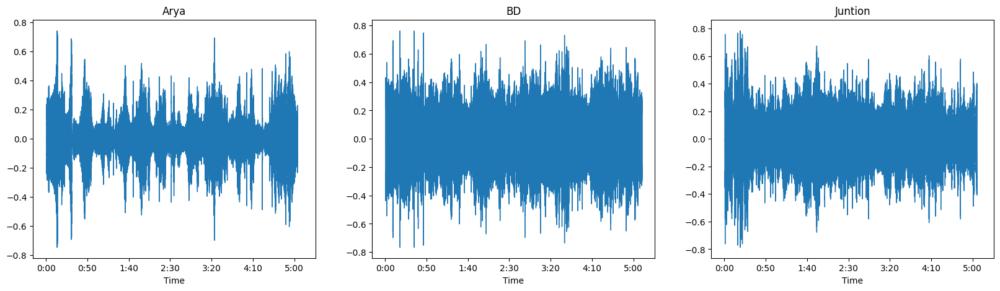

In [7]:
bird_data, bird_sr = librosa.load(
    r"data\\noiseData\\Around Arya School(1°16_32_ S 36°49_29_ E).wav")
cat_data, cat_sr = librosa.load(r"data\\noiseData\\Around Baba Dogo Rd(1°14_51_S 36°52_26_E).wav")
dog_data, dog_sr = librosa.load(r"data\noiseData\Around Junction Mall(1°17_57_S 36°45_49_E).wav")


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5), sharex=True)
librosa.display.waveshow(bird_data, sr=bird_sr, ax=ax1)
ax1.set_title("Arya")

librosa.display.waveshow(cat_data, sr=cat_sr, ax=ax2)
ax2.set_title("BD")

librosa.display.waveshow(dog_data, sr=dog_sr, ax=ax3)
ax3.set_title("Juntion")

plt.show()

In [8]:
import scipy
wav_file_name = 'data\\noiseData\\Around Arya School(1°16_32_ S 36°49_29_ E).wav'
sample_rate, wav_data = wavfile.read(wav_file_name, "rb")
sample_rate, wav_data = ensure_sample_rate(sample_rate, wav_data)

duration = len(wav_data)/sample_rate
print(f'Sample rate: {sample_rate} Hz')
print(f'Total duration: {duration:.2f}s')
print(f'Size of the input: {len(wav_data)}')

Audio(wav_data, rate=sample_rate)

Sample rate: 22000 Hz
Total duration: 303.83s
Size of the input: 6684245


In [9]:
audio_data = np.array(audio_dataframe["audio_data"].to_list())

In [10]:
audio_data.shape

(2185,)

In [11]:
model_yamnet = hub.load('https://tfhub.dev/google/yamnet/1')

In [12]:
waveform_data = []  # Renamed to avoid conflict
for path in audio_dataframe["audio_data"]:
    _, wav_data = read_audio(path)
    waveform_data.append(wav_data)
waveform_data = np.array(waveform_data)
print(f"Shape of waveform_data array: {waveform_data.shape}")  # Debug print

Shape of waveform_data array: (2185, 132000)


In [13]:
audio_embeddings = []
for i in waveform_data:  # Use waveform_data instead of audio_data
    waveform = i / tf.int16.max
    scores, embeddings, spectrogram = model_yamnet(waveform)
    audio_embeddings.append(embeddings)

In [14]:
padded_audio_embeddings = []
for i in audio_embeddings:
    padding_needed = 100-i.shape[0]
    padded_tensor = tf.pad(i, [[0, padding_needed], [0, 0]])
    padded_audio_embeddings.append(padded_tensor)

In [17]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output=False)
classes = ["Bicycle", "MotorCycle", "Private car", "Pickup", "SUV", "PSV", "Buses", 
           "Light trucks", "Medium trucks", "Heavy trucks", "Others"]
ohe.fit(np.array(classes).reshape(-1, 1))  # Fit with the 11 classes
# Ensure audio_data is a list and check structure
if not isinstance(audio_data, list) or not all(isinstance(item, list) and len(item) == 2 for item in audio_data):
    raise ValueError(f"audio_data structure invalid. Expected list of [(path, class), ...], got {audio_data[:5]}")
audio_dataframe = pd.DataFrame(audio_data, columns=["audio_data", "class"])
# Preprocess class column to match fitted categories
audio_dataframe["class"] = audio_dataframe["class"].apply(
    lambda x: "MotorCycle" if x.lower() == "motorcycle" else "Others" if pd.isna(x) or x.lower() == "unknown" else x
)
print(audio_dataframe.head())  # Debug print
classes_encoded = ohe.transform(audio_dataframe[["class"]])  # Transform after preprocessing

ValueError: audio_data structure invalid. Expected list of [(path, class), ...], got ['data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-0.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-1.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-10.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-11.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-12.wav']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output=False)
classes = ["Bicycle", "MotorCycle", "Private car", "Pickup", "SUV", "PSV", "Buses", 
           "Light trucks", "Medium trucks", "Heavy trucks", "Others"]
ohe.fit(np.array(classes).reshape(-1, 1))  # Fit with the 11 classes
# Ensure audio_data is a list and check structure
if not isinstance(audio_data, list) or not all(isinstance(item, list) and len(item) == 2 for item in audio_data):
    raise ValueError(f"audio_data structure invalid. Expected list of [(path, class), ...], got {audio_data[:5]}")
audio_dataframe = pd.DataFrame(audio_data, columns=["audio_data", "class"])
# Preprocess class column to match fitted categories
audio_dataframe["class"] = audio_dataframe["class"].apply(
    lambda x: "MotorCycle" if x.lower() == "motorcycle" else "Others" if pd.isna(x) or x.lower() == "unknown" else x
)
print(audio_dataframe.head())  # Debug print
classes_encoded = ohe.transform(audio_dataframe[["class"]])  # Transform after preprocessing

ValueError: audio_data structure invalid. Expected list of [(path, class), ...], got ['data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-0.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-1.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-10.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-11.wav'
 'data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-12.wav']

In [16]:
audio_data[0]

np.str_('data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-0.wav')

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(
    np.array(padded_audio_embeddings), classes_encoded, random_state=42, test_size=0.2)

In [ ]:
model = models.Sequential([
    layers.Input(shape=(100, 1024)),
    layers.Flatten(),
    layers.Dense(16, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(16, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(16, activation='relu'),
    layers.Dense(11, activation='softmax')  # Updated to 11 classes
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(xtrain, ytrain, epochs=20)

In [ ]:
loss, accuracy = model.evaluate(xtest, ytest)
print(loss, accuracy)

In [ ]:
def pipeline(filename):
    audio_data = read_audio(filename)[1]
    audio_data = audio_data / tf.int16.max
    scores, embeddings, spectrogram = model_yamnet(audio_data)
    padding_needed = 100 - embeddings.shape[0]
    padded_tensor = tf.pad(embeddings, [[0, padding_needed], [0, 0]])
    padded_tensor = tf.reshape(padded_tensor, (1, 100, 1024))
    prob = model.predict(padded_tensor)[0]
    max_index = np.argmax(prob)
    classes = ["Bicycle", "MotorCycle", "Private car", "Pickup", "SUV", "PSV", "Buses", 
               "Light trucks", "Medium trucks", "Heavy trucks", "Others"]
    return classes[max_index]

print("The audio given is of", pipeline('data\\DATA\\output_chunks\\Around Arya School(1°16_32_ S 36°49_29_ E)\\Around Arya School(1°16_32_ S 36°49_29_ E)--1-40.wav'))

In [ ]:
import pandas as pd
import os

# Load the metadata CSV
metadata_path = "data\DATA\output_chunks\metadata.csv"
metadata_df = pd.read_csv(metadata_path)

# Function to classify audio and update metadata
def update_classes(metadata_df):
    for index, row in metadata_df.iterrows():
        audio_file = row['slice_file_name']
        full_path = os.path.join("data\\DATA\\output_chunks", audio_file)
        if os.path.exists(full_path):
            predicted_class = pipeline(full_path)
            # Update the class column only if it's currently "unknown"
            if row['class'] == "unknown":
                metadata_df.at[index, 'class'] = predicted_class
    return metadata_df

# Apply the classification and update
updated_metadata_df = update_classes(metadata_df)

# Save the updated metadata back to CSV
updated_metadata_df.to_csv("updated_metadata.csv", index=False)
print("Updated metadata saved to 'updated_metadata.csv'")